MARINE OIL SPILL DETECTION SYSTEM

🔹 ANALYZING WITH GAUSSIAN FILTER


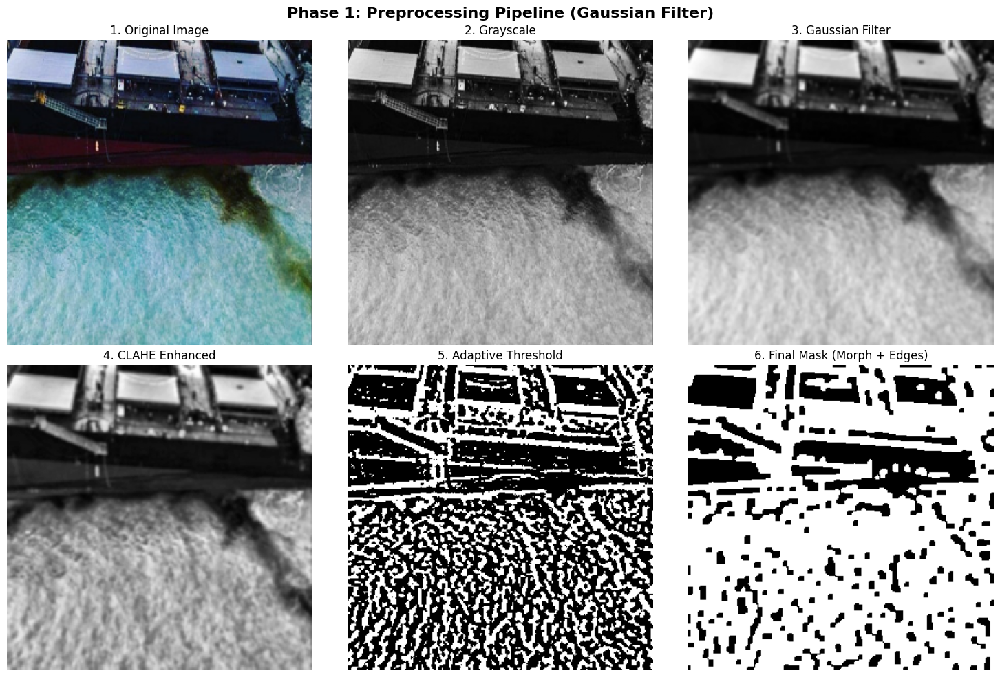


📊 PHASE 1 OUTPUTS (Gaussian Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 3 contours


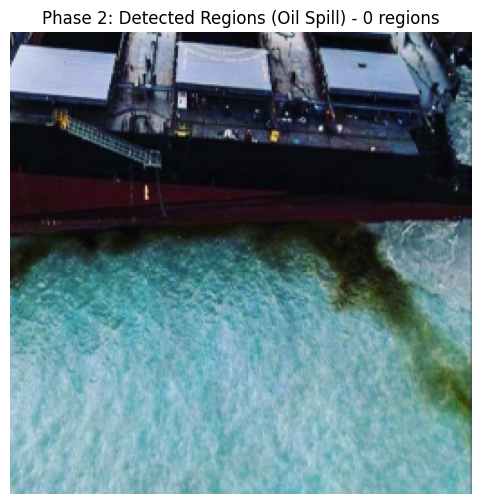

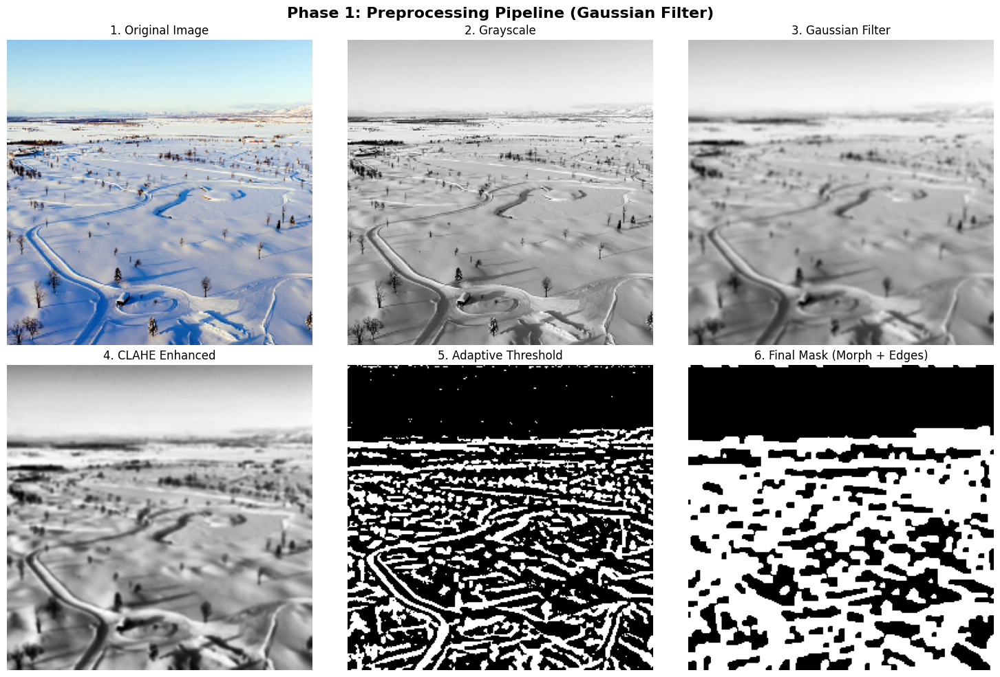


📊 PHASE 1 OUTPUTS (Gaussian Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 13 contours


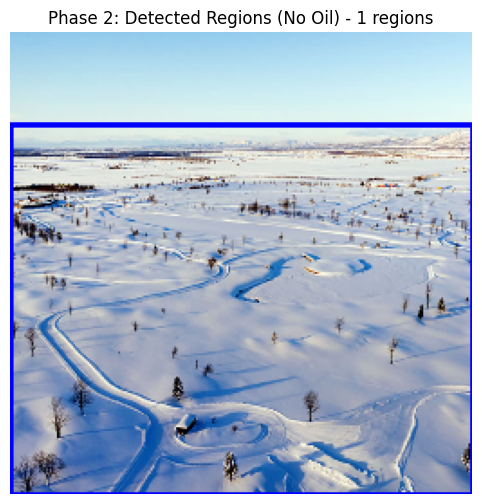


 PHASE 2 OUTPUTS - Sample Feature Vector:
   Area: 45493.50
   Contrast: 446.77
   Homogeneity: 0.26
   Energy: 0.02
   Correlation: 0.88
   Circularity: 0.16
   H_mean: 98.46
   S_mean: 52.58
   V_mean: 191.09
   H_std: 30.43
   S_std: 51.40
   V_std: 30.03

⏱️  Processing time: 16.63 seconds
   Average time per image: 0.055s

✅ Dataset prepared: 504 samples, 12 features


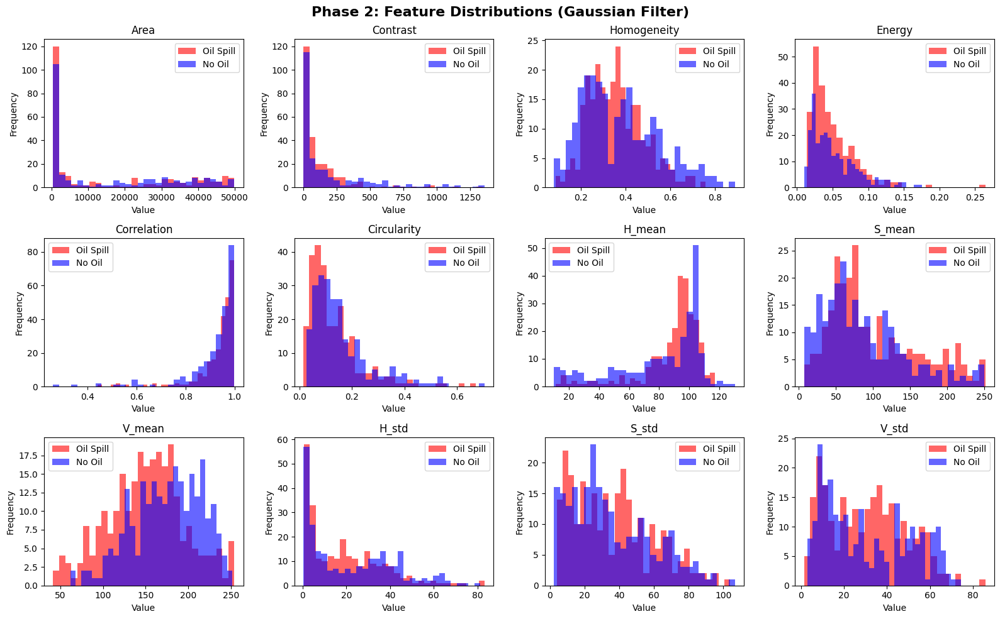

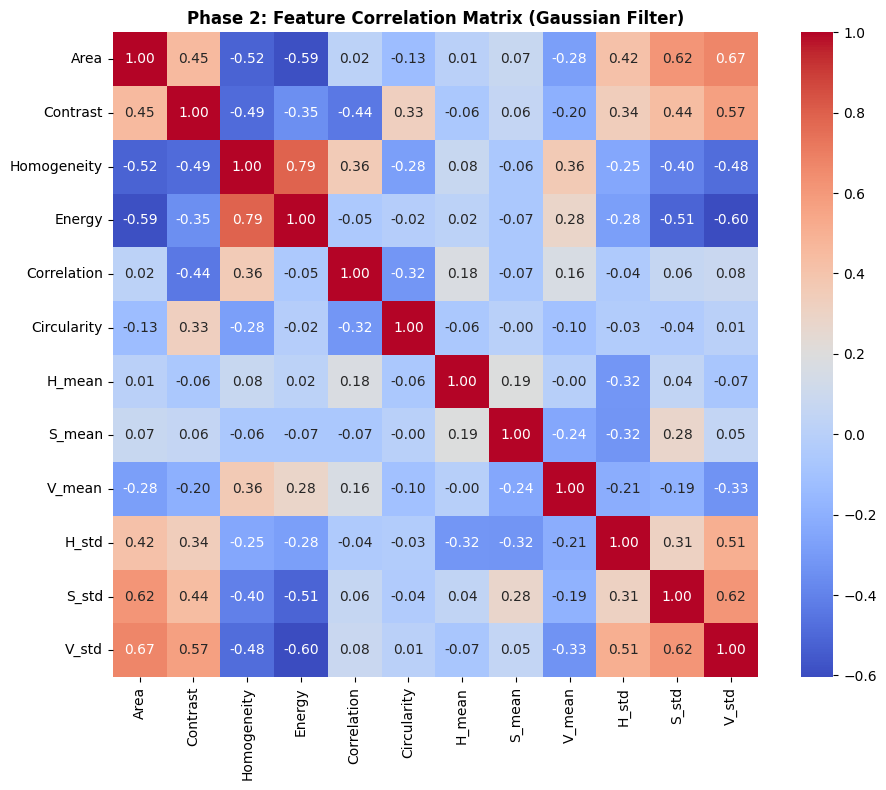


 PHASE 3 OUTPUTS - Classification Results:

Confusion Matrix:
[[30 19]
 [12 40]]

Classification Report:
              precision    recall  f1-score   support

      No Oil       0.71      0.61      0.66        49
   Oil Spill       0.68      0.77      0.72        52

    accuracy                           0.69       101
   macro avg       0.70      0.69      0.69       101
weighted avg       0.70      0.69      0.69       101

Overall Accuracy: 69.31%
Training Time: 0.45 seconds
Training samples: 403
Testing samples: 101


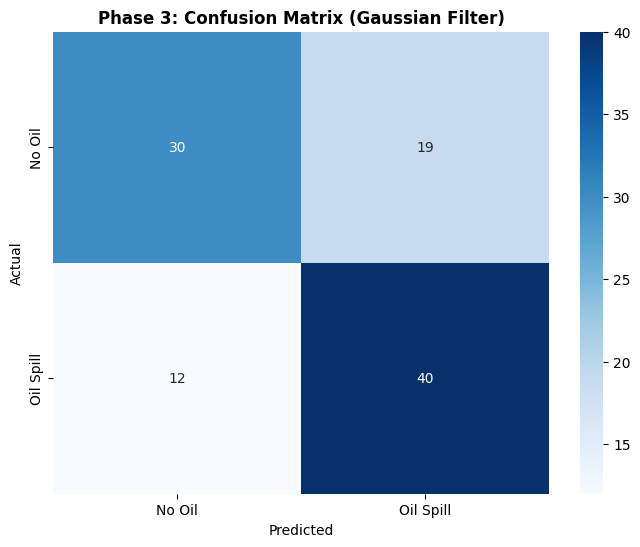

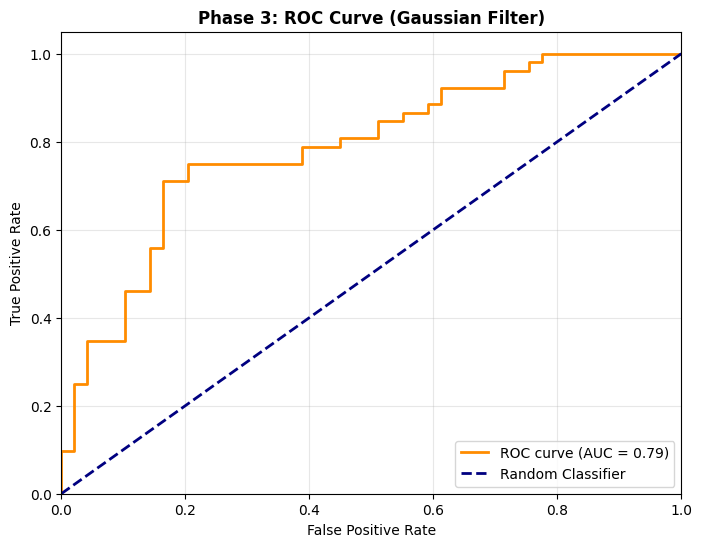

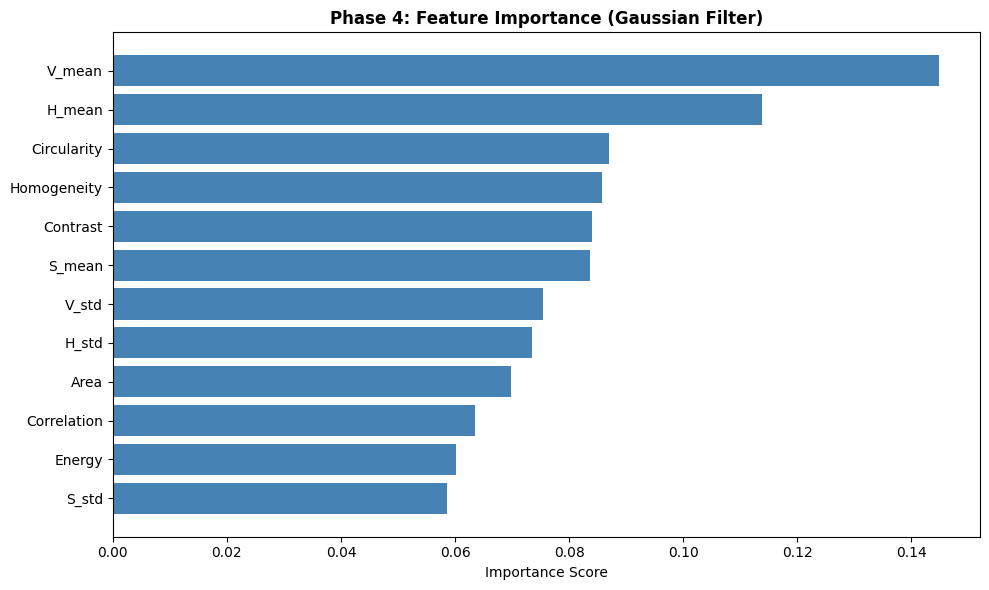


 Top 3 discriminative features:
   1. V_mean: 0.145
   2. H_mean: 0.114
   3. Circularity: 0.087

🔹 ANALYZING WITH MEDIAN FILTER


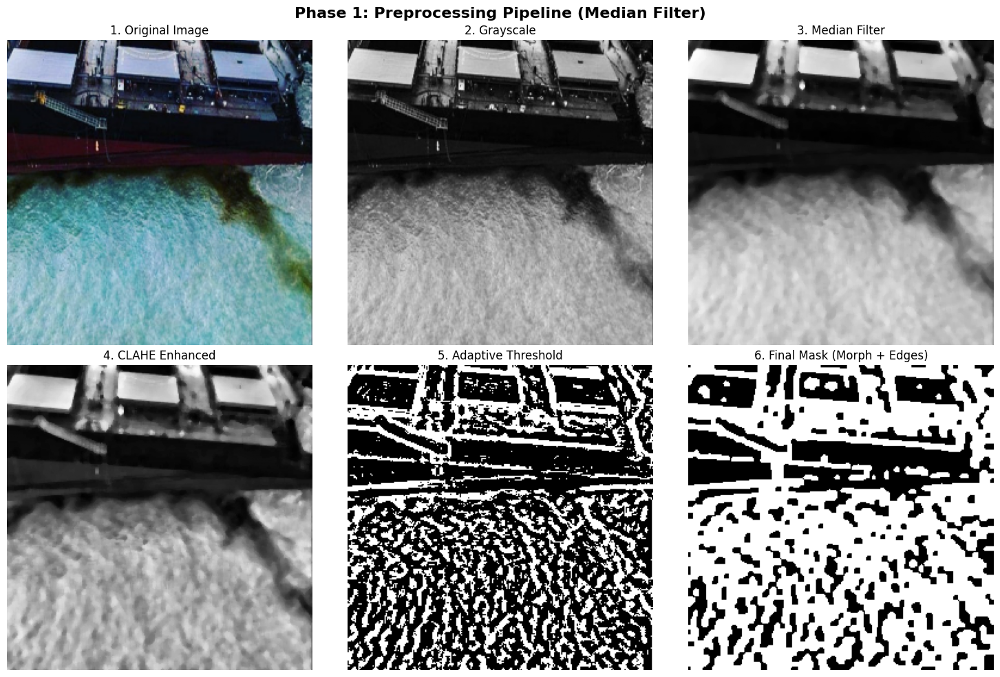


📊 PHASE 1 OUTPUTS (Median Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 21 contours


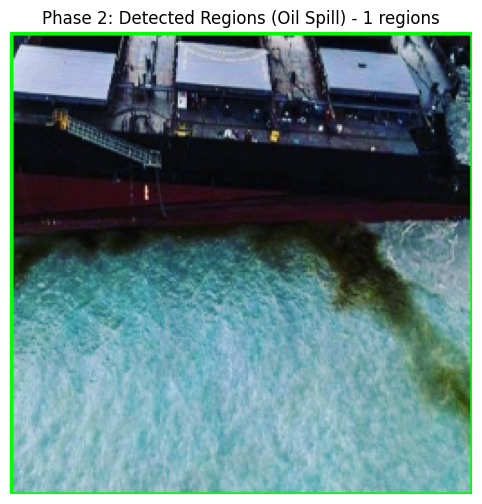


 PHASE 2 OUTPUTS - Sample Feature Vector:
   Area: 48123.50
   Contrast: 227.82
   Homogeneity: 0.23
   Energy: 0.03
   Correlation: 0.97
   Circularity: 0.04
   H_mean: 101.10
   S_mean: 96.17
   V_mean: 122.78
   H_std: 27.85
   S_std: 36.44
   V_std: 74.19


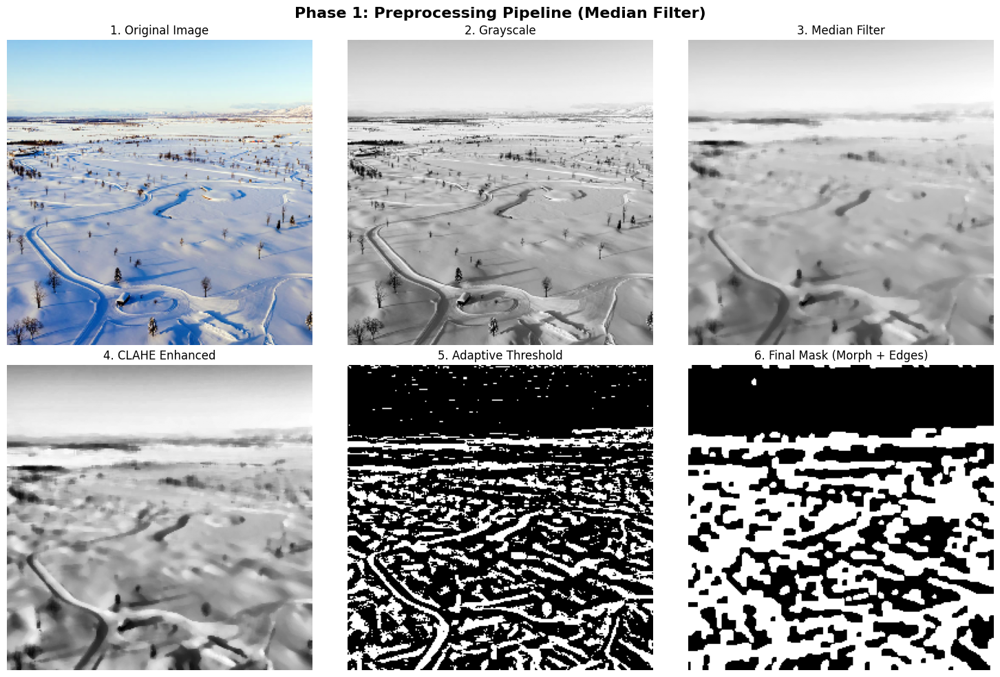


📊 PHASE 1 OUTPUTS (Median Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 39 contours


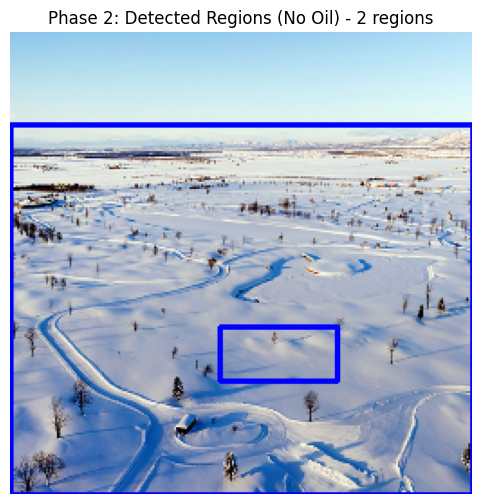


 PHASE 2 OUTPUTS - Sample Feature Vector:
   Area: 764.50
   Contrast: 51.40
   Homogeneity: 0.35
   Energy: 0.05
   Correlation: 0.90
   Circularity: 0.16
   H_mean: 108.22
   S_mean: 44.44
   V_mean: 187.21
   H_std: 20.48
   S_std: 26.82
   V_std: 6.72

⏱️  Processing time: 17.65 seconds
   Average time per image: 0.059s

✅ Dataset prepared: 688 samples, 12 features


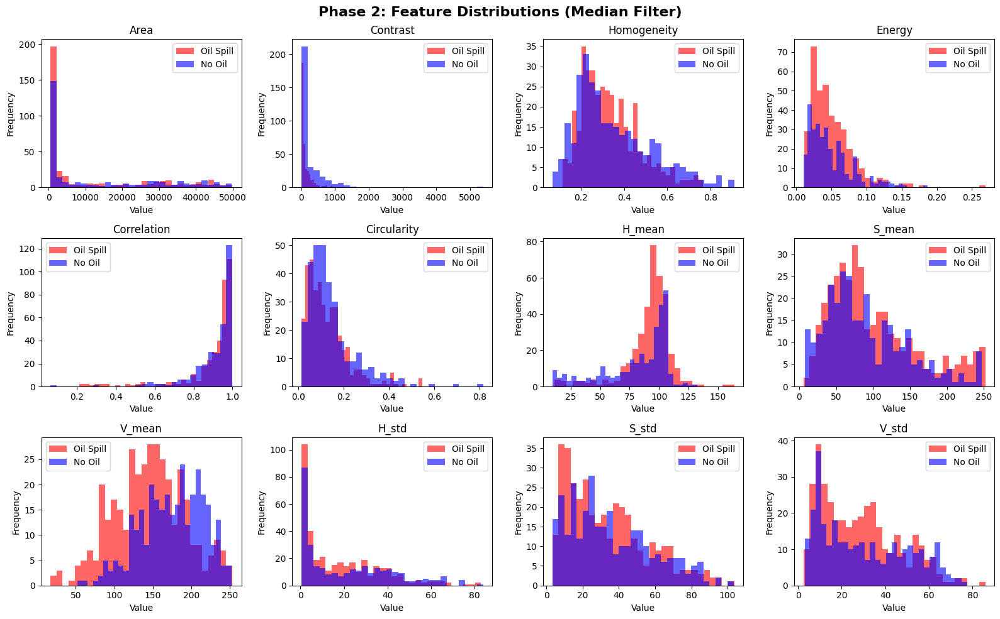

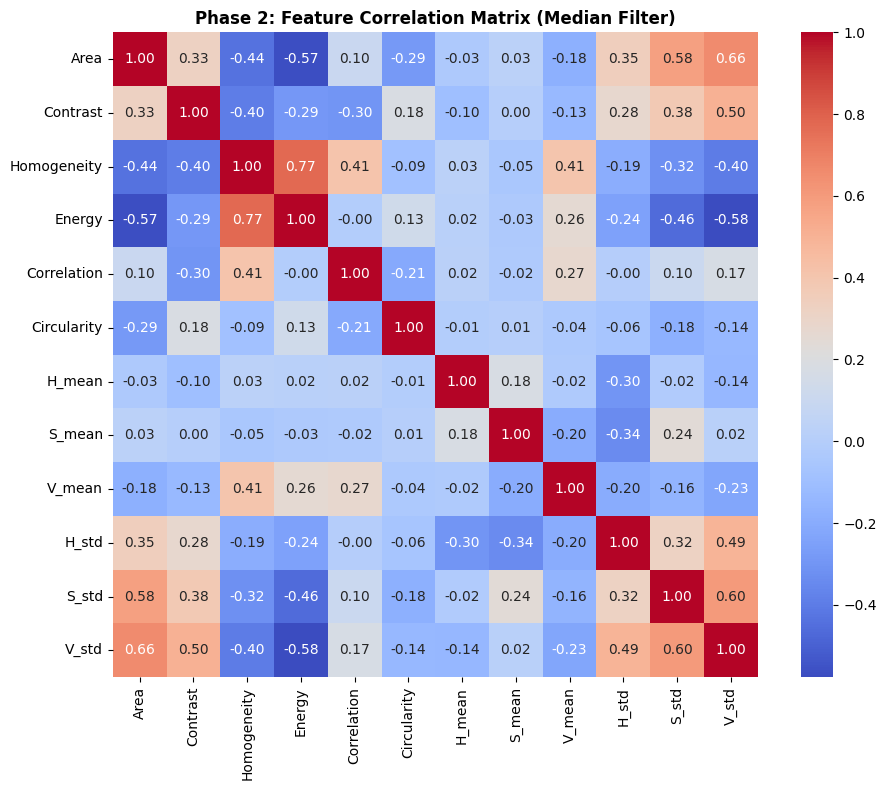


 PHASE 3 OUTPUTS - Classification Results:

Confusion Matrix:
[[42 21]
 [14 61]]

Classification Report:
              precision    recall  f1-score   support

      No Oil       0.75      0.67      0.71        63
   Oil Spill       0.74      0.81      0.78        75

    accuracy                           0.75       138
   macro avg       0.75      0.74      0.74       138
weighted avg       0.75      0.75      0.74       138

Overall Accuracy: 74.64%
Training Time: 0.62 seconds
Training samples: 550
Testing samples: 138


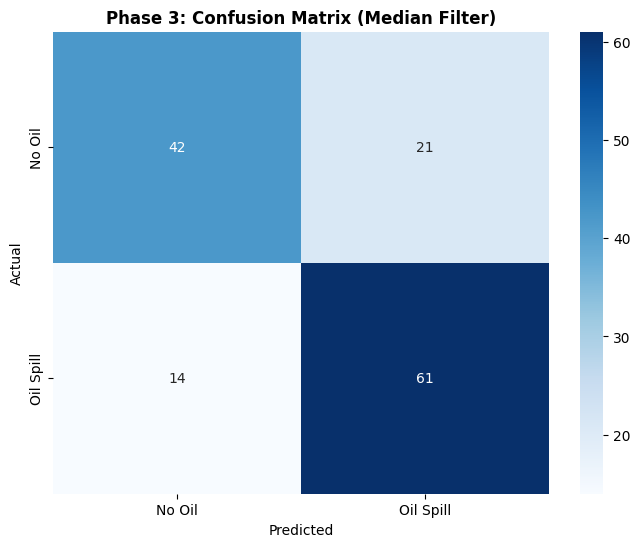

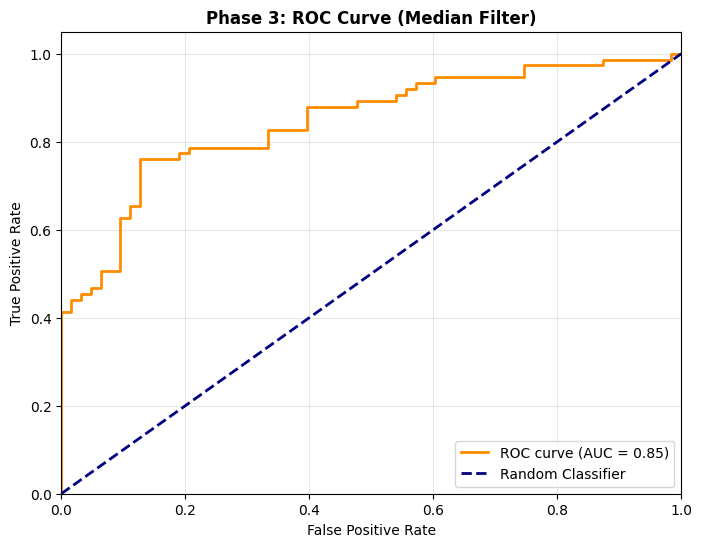

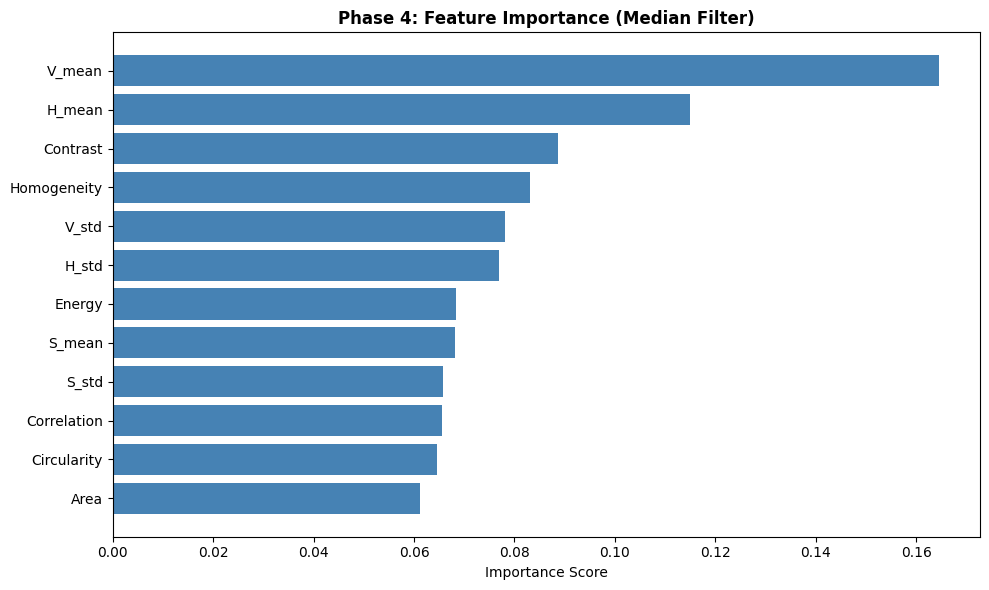


 Top 3 discriminative features:
   1. V_mean: 0.164
   2. H_mean: 0.115
   3. Contrast: 0.089

🔹 ANALYZING WITH BILATERAL FILTER


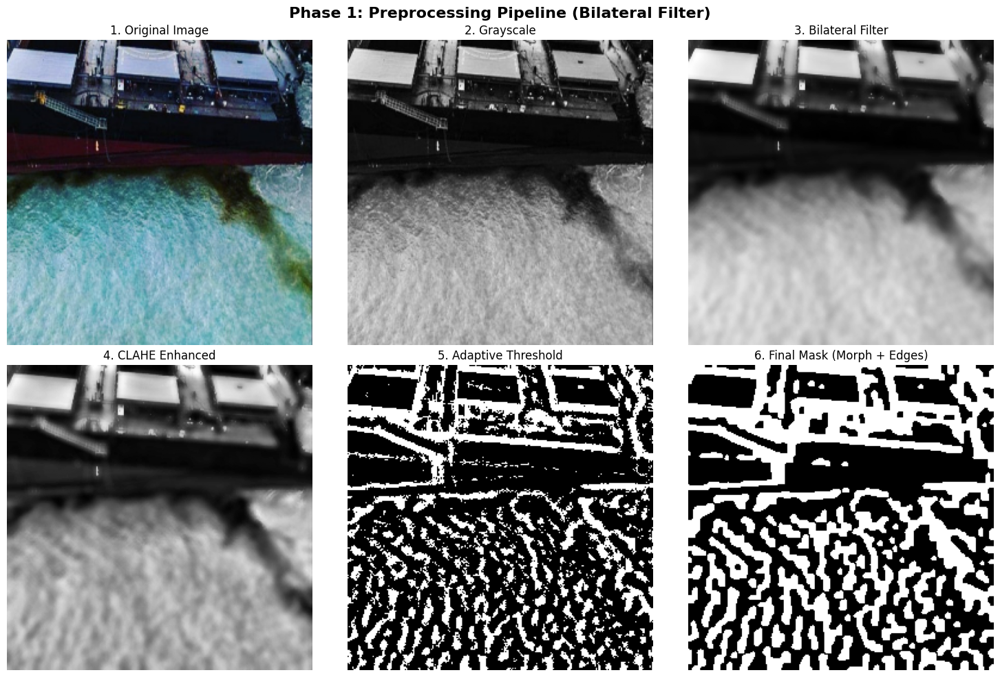


📊 PHASE 1 OUTPUTS (Bilateral Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 100 contours


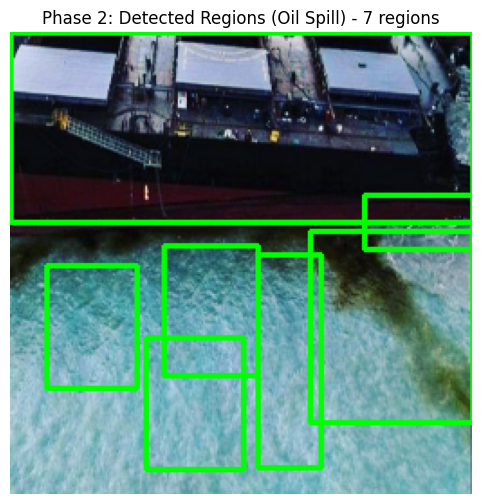


 PHASE 2 OUTPUTS - Sample Feature Vector:
   Area: 916.00
   Contrast: 104.14
   Homogeneity: 0.12
   Energy: 0.03
   Correlation: 0.63
   Circularity: 0.11
   H_mean: 96.55
   S_mean: 91.12
   V_mean: 195.25
   H_std: 2.12
   S_std: 15.70
   V_std: 11.11


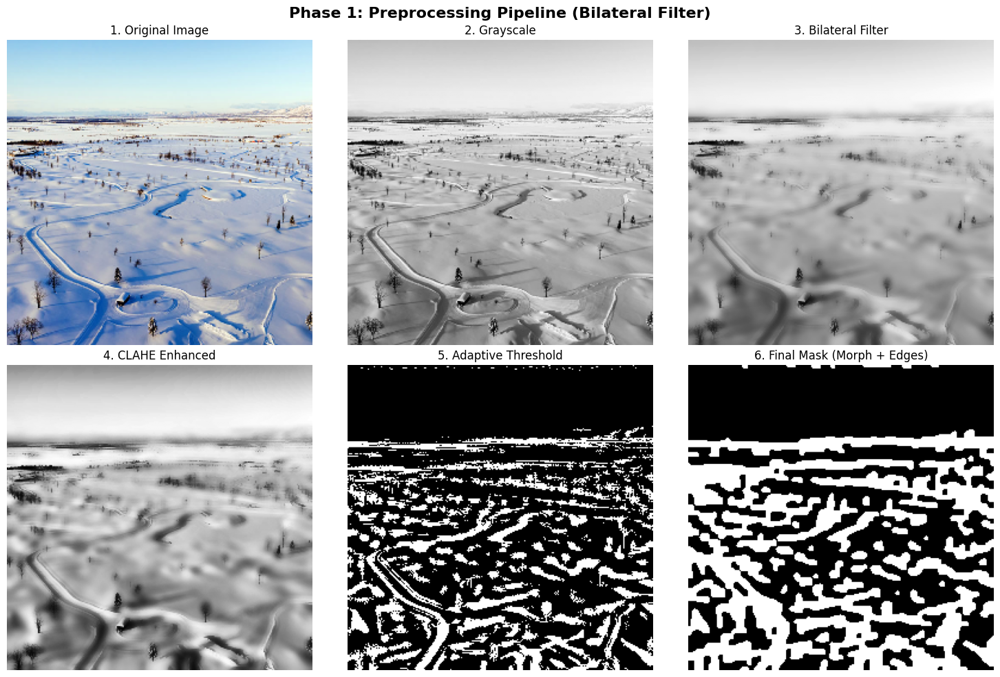


📊 PHASE 1 OUTPUTS (Bilateral Filter):
   Image dimensions: (256, 256, 3)
   Detected regions: 56 contours


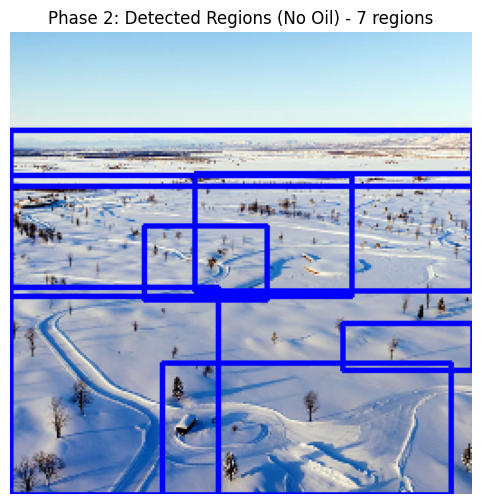


 PHASE 2 OUTPUTS - Sample Feature Vector:
   Area: 5500.50
   Contrast: 435.26
   Homogeneity: 0.24
   Energy: 0.03
   Correlation: 0.82
   Circularity: 0.07
   H_mean: 103.55
   S_mean: 73.54
   V_mean: 179.32
   H_std: 27.72
   S_std: 57.02
   V_std: 21.79

⏱️  Processing time: 21.92 seconds
   Average time per image: 0.073s

✅ Dataset prepared: 1215 samples, 12 features


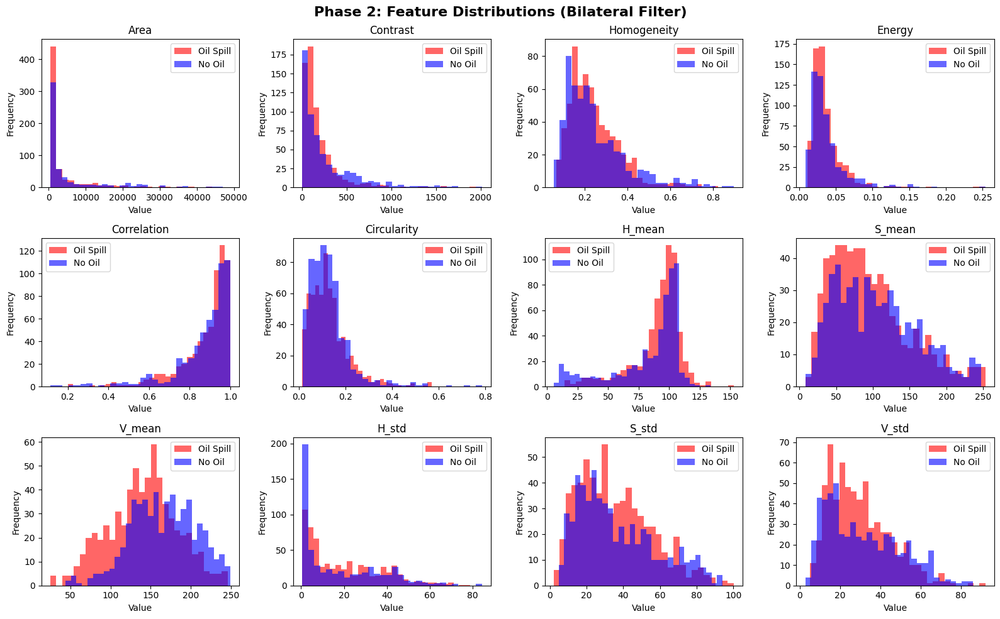

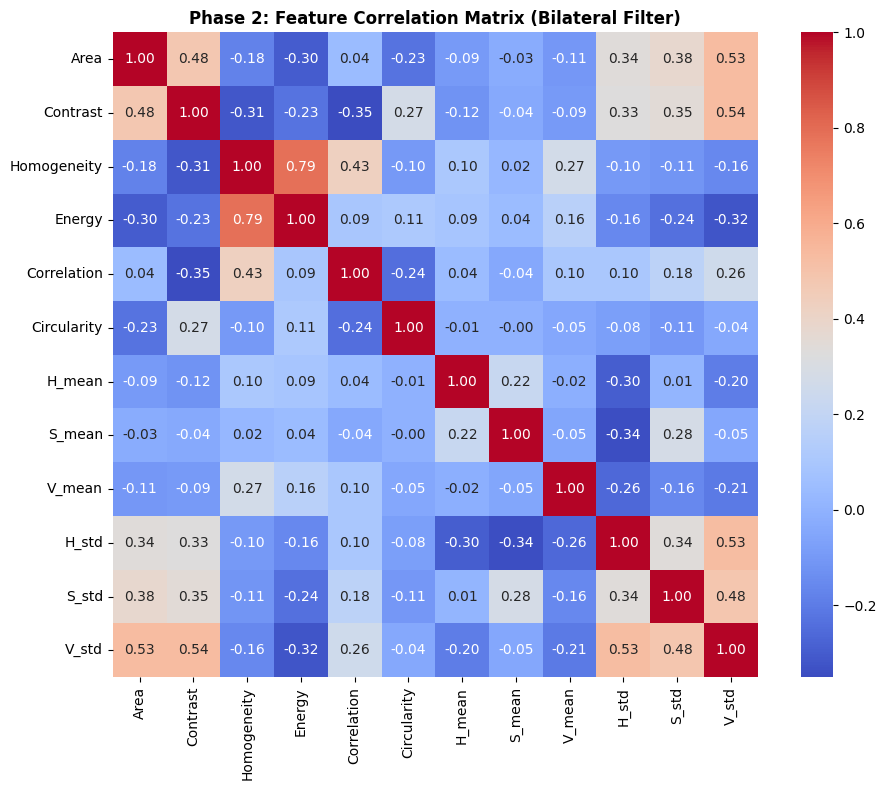


 PHASE 3 OUTPUTS - Classification Results:

Confusion Matrix:
[[ 85  28]
 [ 29 101]]

Classification Report:
              precision    recall  f1-score   support

      No Oil       0.75      0.75      0.75       113
   Oil Spill       0.78      0.78      0.78       130

    accuracy                           0.77       243
   macro avg       0.76      0.76      0.76       243
weighted avg       0.77      0.77      0.77       243

Overall Accuracy: 76.54%
Training Time: 1.05 seconds
Training samples: 972
Testing samples: 243


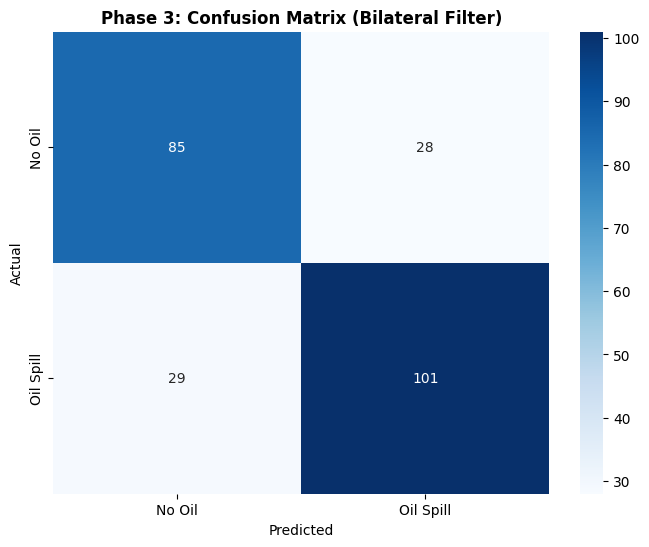

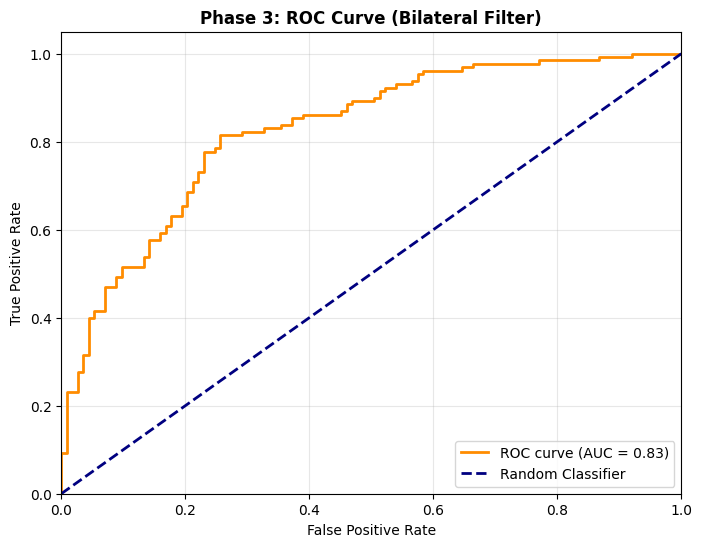

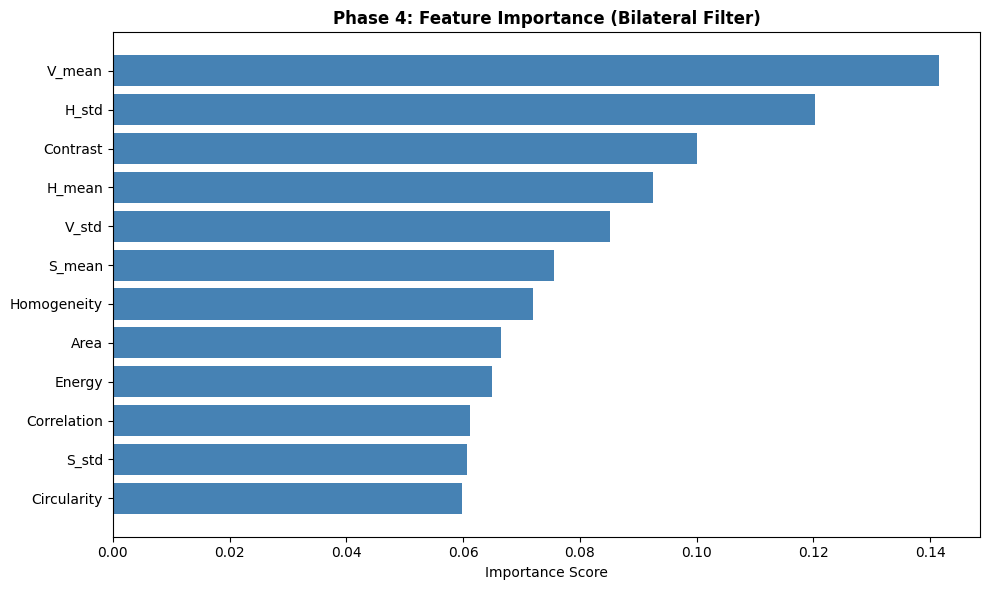


 Top 3 discriminative features:
   1. V_mean: 0.141
   2. H_std: 0.120
   3. Contrast: 0.100

 PHASE 4 - COMPARATIVE ANALYSIS
   Filter  Accuracy  Precision   Recall  F1-Score  Training Time
 Gaussian  0.693069   0.695587 0.693069  0.690942       0.449791
   Median  0.746377   0.746686 0.746377  0.744571       0.617465
Bilateral  0.765432   0.765586 0.765432  0.765496       1.048699


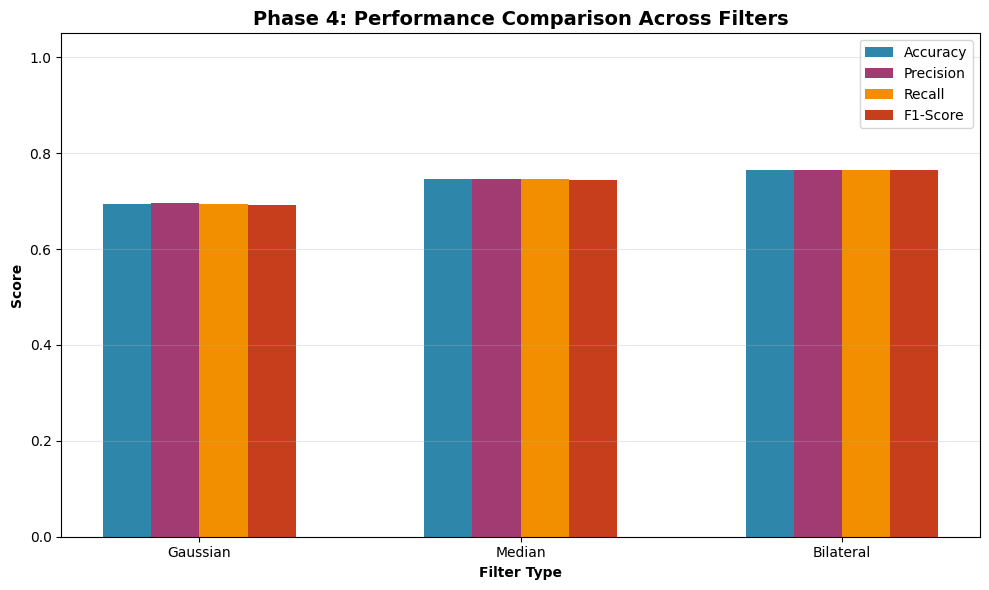

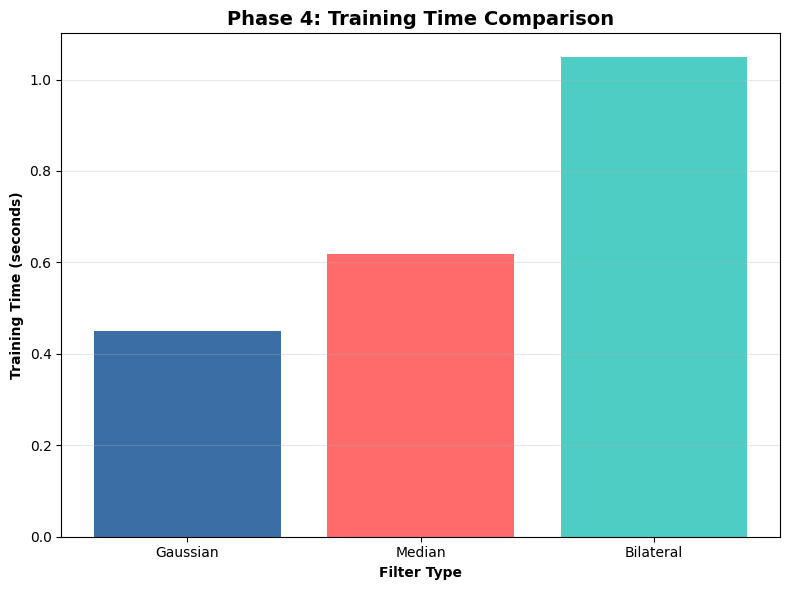


BEST PERFORMING CONFIGURATION
Filter: Bilateral
Accuracy: 76.54%
Precision: 0.766
Recall: 0.765
F1-Score: 0.765
Training Time: 1.05s


In [ ]:
import cv2
import numpy as np
import os
import time
from skimage.feature import graycomatrix, graycoprops
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_recall_fscore_support, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
os.makedirs("outputs", exist_ok=True)

# 1️. IMAGE PREPROCESSING FUNCTION
def preprocess_image(image_path, filter_type="Gaussian", save_steps=False, output_name="sample"):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, (256, 256))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # We Apply filters here
    if filter_type == "Gaussian":
        gray_filtered = cv2.GaussianBlur(gray, (5, 5), 0)
    elif filter_type == "Median":
        gray_filtered = cv2.medianBlur(gray, 5)
    elif filter_type == "Bilateral":
        gray_filtered = cv2.bilateralFilter(gray, 9, 75, 75)
    else:
        gray_filtered = gray

    # Contrast Enhancement (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray_filtered)

    # Adaptive Thresholding
    thresh = cv2.adaptiveThreshold(
        enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 11, 3
    )
    kernel = np.ones((3,3), np.uint8)
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    morph = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel, iterations=1)

    # Edge Detection
    edges = cv2.Canny(morph, 100, 200)

    # Combined Mask
    combined = cv2.bitwise_or(morph, edges)

    if save_steps:
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        fig.suptitle(f'Phase 1: Preprocessing Pipeline ({filter_type} Filter)', fontsize=16, fontweight='bold')

        axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title('1. Original Image')
        axes[0, 0].axis('off')

        axes[0, 1].imshow(gray, cmap='gray')
        axes[0, 1].set_title('2. Grayscale')
        axes[0, 1].axis('off')

        axes[0, 2].imshow(gray_filtered, cmap='gray')
        axes[0, 2].set_title(f'3. {filter_type} Filter')
        axes[0, 2].axis('off')

        axes[1, 0].imshow(enhanced, cmap='gray')
        axes[1, 0].set_title('4. CLAHE Enhanced')
        axes[1, 0].axis('off')

        axes[1, 1].imshow(thresh, cmap='gray')
        axes[1, 1].set_title('5. Adaptive Threshold')
        axes[1, 1].axis('off')

        axes[1, 2].imshow(combined, cmap='gray')
        axes[1, 2].set_title('6. Final Mask (Morph + Edges)')
        axes[1, 2].axis('off')

        plt.tight_layout()
        plt.savefig(f'outputs/phase1_preprocessing_{output_name}_{filter_type}.png', dpi=300, bbox_inches='tight')
        plt.show()
        contours, _ = cv2.findContours(combined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        print(f"\n📊 PHASE 1 OUTPUTS ({filter_type} Filter):")
        print(f"   Image dimensions: {img.shape}")
        print(f"   Detected regions: {len(contours)} contours")

    return img, gray, combined

# 2️.FEATURE EXTRACTION FUNCTION
def extract_features(img, gray, mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < 500 or area > 50000:
            continue

        x, y, w, h = cv2.boundingRect(cnt)
        roi_gray = gray[y:y+h, x:x+w]
        roi_hsv = hsv[y:y+h, x:x+w]

        if roi_gray.size == 0:
            continue

        # Texture Features (GLCM)
        glcm = graycomatrix(roi_gray, [1], [0], symmetric=True, normed=True)
        contrast = graycoprops(glcm, 'contrast')[0,0]
        homogeneity = graycoprops(glcm, 'homogeneity')[0,0]
        energy = graycoprops(glcm, 'energy')[0,0]
        correlation = graycoprops(glcm, 'correlation')[0,0]

        # Shape Features
        perimeter = cv2.arcLength(cnt, True)
        circularity = (4 * np.pi * area) / (perimeter**2 + 1e-5)

        # Color Features (HSV Mean/Std)
        h_mean = np.mean(roi_hsv[:,:,0])
        s_mean = np.mean(roi_hsv[:,:,1])
        v_mean = np.mean(roi_hsv[:,:,2])
        h_std = np.std(roi_hsv[:,:,0])
        s_std = np.std(roi_hsv[:,:,1])
        v_std = np.std(roi_hsv[:,:,2])

        features.append([
            area, contrast, homogeneity, energy, correlation, circularity,
            h_mean, s_mean, v_mean, h_std, s_std, v_std
        ])

    return np.array(features)


def visualize_feature_extraction(img, mask, features, label, output_name="sample"):
    """PHASE 2 OUTPUT: Visualize feature extraction"""

    # Draw bounding boxes on detected regions
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_annotated = img.copy()
    valid_contours = 0

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < 500 or area > 50000:
            continue
        x, y, w, h = cv2.boundingRect(cnt)
        color = (0, 255, 0) if label == 1 else (255, 0, 0)
        cv2.rectangle(img_annotated, (x, y), (x+w, y+h), color, 2)
        valid_contours += 1

    # Display annotated image
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(img_annotated, cv2.COLOR_BGR2RGB))
    plt.title(f'Phase 2: Detected Regions ({"Oil Spill" if label == 1 else "No Oil"}) - {valid_contours} regions')
    plt.axis('off')
    plt.savefig(f'outputs/phase2_detection_{output_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Print sample feature vector
    if len(features) > 0:
        print(f"\n PHASE 2 OUTPUTS - Sample Feature Vector:")
        feature_names = ["Area", "Contrast", "Homogeneity", "Energy", "Correlation",
                        "Circularity", "H_mean", "S_mean", "V_mean", "H_std", "S_std", "V_std"]
        for name, value in zip(feature_names, features[0]):
            print(f"   {name}: {value:.2f}")

# 3️. DATASET PREPARATION FUNCTION

def prepare_dataset(oil_folder, non_oil_folder, filter_type="Gaussian"):
    X, y = [], []
    all_images = []
    all_features_oil = []
    all_features_no_oil = []

    start_time = time.time()

    for folder, label in [(oil_folder, 1), (non_oil_folder, 0)]:
        for i, file in enumerate(os.listdir(folder)):
            path = os.path.join(folder, file)
            save_steps = (i == 0)
            output_name = "oil" if label == 1 else "no_oil"

            processed = preprocess_image(path, filter_type, save_steps, output_name)
            if processed is None:
                continue

            img, gray, mask = processed
            feats = extract_features(img, gray, mask)

            if len(feats) > 0:
                X.extend(feats)
                y.extend([label] * len(feats))
                if label == 1:
                    all_features_oil.extend(feats)
                else:
                    all_features_no_oil.extend(feats)
            if i == 0:
                all_images.append((img, mask, label))
                visualize_feature_extraction(img, mask, feats, label, output_name)

    processing_time = time.time() - start_time
    print(f"\n⏱️  Processing time: {processing_time:.2f} seconds")
    print(f"   Average time per image: {processing_time/len(os.listdir(oil_folder) + os.listdir(non_oil_folder)):.3f}s")

    return np.array(X), np.array(y), all_images, np.array(all_features_oil), np.array(all_features_no_oil)


def plot_feature_distributions(features_oil, features_no_oil, filter_type):
    """PHASE 2 OUTPUT: Feature distribution plots"""
    feature_names = ["Area", "Contrast", "Homogeneity", "Energy", "Correlation",
                    "Circularity", "H_mean", "S_mean", "V_mean", "H_std", "S_std", "V_std"]

    fig, axes = plt.subplots(3, 4, figsize=(16, 10))
    fig.suptitle(f'Phase 2: Feature Distributions ({filter_type} Filter)', fontsize=16, fontweight='bold')
    axes = axes.ravel()

    for idx, feature_name in enumerate(feature_names):
        if len(features_oil) > 0 and len(features_no_oil) > 0:
            axes[idx].hist(features_oil[:, idx], bins=30, alpha=0.6, label='Oil Spill', color='red')
            axes[idx].hist(features_no_oil[:, idx], bins=30, alpha=0.6, label='No Oil', color='blue')
            axes[idx].set_title(feature_name)
            axes[idx].legend()
            axes[idx].set_xlabel('Value')
            axes[idx].set_ylabel('Frequency')

    plt.tight_layout()
    plt.savefig(f'outputs/phase2_feature_distributions_{filter_type}.png', dpi=300, bbox_inches='tight')
    plt.show()


def plot_correlation_heatmap(X, filter_type):
    """PHASE 2 OUTPUT: Feature correlation heatmap"""
    feature_names = ["Area", "Contrast", "Homogeneity", "Energy", "Correlation",
                    "Circularity", "H_mean", "S_mean", "V_mean", "H_std", "S_std", "V_std"]

    df = pd.DataFrame(X, columns=feature_names)
    corr = df.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', square=True,
                xticklabels=feature_names, yticklabels=feature_names)
    plt.title(f'Phase 2: Feature Correlation Matrix ({filter_type} Filter)', fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'outputs/phase2_correlation_heatmap_{filter_type}.png', dpi=300, bbox_inches='tight')
    plt.show()

# 4️. TRAIN & EVALUATE MODEL
def train_and_evaluate(oil_folder, non_oil_folder):
    filters = ["Gaussian", "Median", "Bilateral"]
    all_results = []

    for f in filters:
        print(f"\n{'='*60}")
        print(f"🔹 ANALYZING WITH {f.upper()} FILTER")
        print(f"{'='*60}")

        X, y, images_to_show, features_oil, features_no_oil = prepare_dataset(oil_folder, non_oil_folder, filter_type=f)
        print(f"\n✅ Dataset prepared: {X.shape[0]} samples, {X.shape[1]} features")

        # PHASE 2 OUTPUTS
        plot_feature_distributions(features_oil, features_no_oil, f)
        plot_correlation_heatmap(X, f)

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42, stratify=y
        )

        train_start = time.time()
        clf = RandomForestClassifier(n_estimators=150, max_depth=12, random_state=42)
        clf.fit(X_train, y_train)
        train_time = time.time() - train_start

        y_pred = clf.predict(X_test)
        y_pred_proba = clf.predict_proba(X_test)[:, 1]

        acc = accuracy_score(y_test, y_pred)
        precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='weighted')

        all_results.append({
            'Filter': f,
            'Accuracy': acc,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1,
            'Training Time': train_time
        })

        cm = confusion_matrix(y_test, y_pred)
        report = classification_report(y_test, y_pred, target_names=["No Oil", "Oil Spill"])

        print(f"\n PHASE 3 OUTPUTS - Classification Results:")
        print(f"\nConfusion Matrix:\n{cm}")
        print(f"\nClassification Report:\n{report}")
        print(f"Overall Accuracy: {acc*100:.2f}%")
        print(f"Training Time: {train_time:.2f} seconds")
        print(f"Training samples: {len(X_train)}")
        print(f"Testing samples: {len(X_test)}")

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=["No Oil", "Oil Spill"],
                    yticklabels=["No Oil", "Oil Spill"])
        plt.title(f'Phase 3: Confusion Matrix ({f} Filter)', fontweight='bold')
        plt.ylabel('Actual')
        plt.xlabel('Predicted')
        plt.savefig(f'outputs/phase3_confusion_matrix_{f}.png', dpi=300, bbox_inches='tight')
        plt.show()

        # ROC Curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Phase 3: ROC Curve ({f} Filter)', fontweight='bold')
        plt.legend(loc="lower right")
        plt.grid(alpha=0.3)
        plt.savefig(f'outputs/phase3_roc_curve_{f}.png', dpi=300, bbox_inches='tight')
        plt.show()

        # Feature Importance
        importances = clf.feature_importances_
        feature_names = ["Area", "Contrast", "Homogeneity", "Energy", "Correlation",
                        "Circularity", "H_mean", "S_mean", "V_mean", "H_std", "S_std", "V_std"]

        indices = np.argsort(importances)[::-1]

        plt.figure(figsize=(10, 6))
        plt.barh(range(len(importances)), importances[indices], color='steelblue')
        plt.yticks(range(len(importances)), [feature_names[i] for i in indices])
        plt.xlabel('Importance Score')
        plt.title(f'Phase 4: Feature Importance ({f} Filter)', fontweight='bold')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.savefig(f'outputs/phase4_feature_importance_{f}.png', dpi=300, bbox_inches='tight')
        plt.show()

        print(f"\n Top 3 discriminative features:")
        for i in range(3):
            print(f"   {i+1}. {feature_names[indices[i]]}: {importances[indices[i]]:.3f}")


    results_df = pd.DataFrame(all_results)
    print(f"\n{'='*60}")
    print(" PHASE 4 - COMPARATIVE ANALYSIS")
    print(f"{'='*60}")
    print(results_df.to_string(index=False))

    # Accuracy comparison
    plt.figure(figsize=(10, 6))
    x = range(len(results_df))
    width = 0.15

    plt.bar([i - width*1.5 for i in x], results_df['Accuracy'], width, label='Accuracy', color='#2E86AB')
    plt.bar([i - width*0.5 for i in x], results_df['Precision'], width, label='Precision', color='#A23B72')
    plt.bar([i + width*0.5 for i in x], results_df['Recall'], width, label='Recall', color='#F18F01')
    plt.bar([i + width*1.5 for i in x], results_df['F1-Score'], width, label='F1-Score', color='#C73E1D')

    plt.xlabel('Filter Type', fontweight='bold')
    plt.ylabel('Score', fontweight='bold')
    plt.title('Phase 4: Performance Comparison Across Filters', fontsize=14, fontweight='bold')
    plt.xticks(x, results_df['Filter'])
    plt.ylim(0, 1.05)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('outputs/phase4_performance_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Processing time comparison
    plt.figure(figsize=(8, 6))
    plt.bar(results_df['Filter'], results_df['Training Time'], color=['#3A6EA5', '#FF6B6B', '#4ECDC4'])
    plt.xlabel('Filter Type', fontweight='bold')
    plt.ylabel('Training Time (seconds)', fontweight='bold')
    plt.title('Phase 4: Training Time Comparison', fontsize=14, fontweight='bold')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('outputs/phase4_training_time.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Final Summary
    best_filter = results_df.loc[results_df['Accuracy'].idxmax()]
    print(f"\n{'='*60}")
    print("BEST PERFORMING CONFIGURATION")
    print(f"{'='*60}")
    print(f"Filter: {best_filter['Filter']}")
    print(f"Accuracy: {best_filter['Accuracy']*100:.2f}%")
    print(f"Precision: {best_filter['Precision']:.3f}")
    print(f"Recall: {best_filter['Recall']:.3f}")
    print(f"F1-Score: {best_filter['F1-Score']:.3f}")
    print(f"Training Time: {best_filter['Training Time']:.2f}s")


if __name__ == "__main__":
    oil_folder = "Dataset/oil_spill"
    non_oil_folder = "Dataset/no_oil_spill"

    print("MARINE OIL SPILL DETECTION SYSTEM")

    train_and_evaluate(oil_folder, non_oil_folder)